In [1]:
using JLD2
using Printf
using CairoMakie
using FourierFlows
using LsqFit
include("AnalysisUtils.jl")

mapfilter_snapshots (generic function with 1 method)

In [2]:
#data_directory = "/scratch/nad9961/swqg/58025661" # Long time run
data_directory = "/scratch/nad9961/swqg/58031124" # Very low Froude number runs
#data_directory = "/scratch/nad9961/swqg/57615490/"
# data_directory = "/scratch/nad9961/swqg/57478238/"
# data_directory = "/scratch/nad9961/swqg_rays/57350017/" # Dispersion relationship == 0
# data_directory = "/scratch/nad9961/swqg/57233897/" # Matches RSW run 57233890
# data_directory = "/scratch/nad9961/swqg/57188406/"
# data_directory = "/scratch/nad9961/swqg/52585523/"

matern_model(ω, p) = @. p[1] * ((ω - p[2])^2 + p[3]^2)^p[4]
log_matern_model(ω, p) = @. log(p[1] * ((ω - p[2])^2 + p[3]^2)^p[4])

function mean(data)
    return sum(data) / length(data)
end

function variance(data)
    return sum((data .- mean(data)).^2) / length(data)
end

function idxcounts(idxtuple, Nbins)
    bincounts = zeros(Nbins, Nbins)
    for (i,j)=idxtuple
        bincounts[i,j] += 1
    end
    return bincounts
end

function read_parameters(directory)
    file = jldopen(@sprintf("%s/packets.%06d.jld2", directory, 0))
    f0 = file["params/f0"]
    Cg = file["params/Cg"]
    close(file)
    return f0, Cg
end

function load_last_snapshot(directory, grid)
    filename_func(idx) = @sprintf("%s/qgsw.%06d.jld2", directory, idx)
    num_files = sum([1 for file in readdir(directory) if occursin("qgsw.", file)])-1
    first_file = jldopen(@sprintf("%s/qgsw.%06d.jld2", directory, 0))
    last_file = jldopen(@sprintf("%s/qgsw.%06d.jld2", directory, num_files))
    
    Kd2 = first_file["params/Kd2"]
    last_key = keys(last_file["snapshots/t"])[end]
    t_final = last_file["snapshots/t/" * last_key]
    qh_final = last_file["snapshots/sol/" * last_key]
    ψh_final = -qh_final ./ (grid.Krsq .+ Kd2)
    uh_final = -1im * grid.l .* ψh_final
    vh_final =  1im * grid.kr .* ψh_final
    q_final = irfft(qh_final, grid.nx)
    ψ_final = irfft(ψh_final, grid.nx)
    u_final = irfft(uh_final, grid.nx)
    v_final = irfft(vh_final, grid.nx)
    
    println(last_file["snapshots/t/" * last_key])
    close(last_file)
    return t_final, q_final, ψ_final, u_final, v_final, Kd2
end

function load_first_last_frame(directory)
    filename_func(idx) = @sprintf("%s/packets.%06d.jld2", directory, idx)
    num_files = sum([1 for file in readdir(directory) if occursin("packets.", file)])-1
    first_file = jldopen(@sprintf("%s/packets.%06d.jld2", directory, 0))
    last_file = jldopen(@sprintf("%s/packets.%06d.jld2", directory, num_files))
    first_snapshot = keys(first_file["p/t"])[1]
    last_snapshot = keys(last_file["p/t"])[end]
    t0 = first_file["p/t/" * first_snapshot]
    x0 = first_file["p/x/" * first_snapshot]
    k0 = first_file["p/k/" * first_snapshot]
    u0 = first_file["p/u/" * first_snapshot]
    t1 =  last_file["p/t/" * last_snapshot]
    x1 =  last_file["p/x/" * last_snapshot]
    k1 =  last_file["p/k/" * last_snapshot]
    u1 =  last_file["p/u/" * last_snapshot]
    close(last_file)
    close(first_file)
    return (t0, x0, k0, u0), (t1, x1, k1, u1)
end

function count_snapshots(directory)
    num_snapshots = 0
    filename_func(idx) = @sprintf("%s/packets.%06d.jld2", directory, idx)
    num_files = sum([1 for file in readdir(directory) if occursin("packets.", file)])-1
    file_idx = 1
    for j=0:num_files
        file = jldopen(filename_func(j))
        num_snapshots += length(keys(file["p/t"]))
        close(file)
    end
    return num_snapshots
end

function count_qgsw_snapshots(directory)
    num_snapshots = 0
    filename_func(idx) = @sprintf("%s/qgsw.%06d.jld2", directory, idx)
    num_files = sum([1 for file in readdir(directory) if occursin("qgsw.", file)])-1
    file_idx = 1
    for j=0:num_files
        file = jldopen(filename_func(j))
        num_snapshots += length(keys(file["snapshots/t"]))
        close(file)
    end
    return num_snapshots
end

function load_snapshot(directory, snap_idx)
    filename_func(idx) = @sprintf("%s/packets.%06d.jld2", directory, idx)
    num_files = sum([1 for file in readdir(directory) if occursin("packets.", file)])-1
    file_idx = 0
    num_snapshots = 0
    file = nothing
    file_idx = snap_idx
    for j=0:num_files
        file = jldopen(filename_func(j))
        num_snapshots += length(keys(file["p/t"]))
        if snap_idx <= num_snapshots
            break
        end
        file_idx -= length(keys(file["p/t"]))
        close(file)
    end
    snapshot = keys(file["p/t"])[file_idx]
    t =  file["p/t/" * snapshot]
    x =  file["p/x/" * snapshot]
    k =  file["p/k/" * snapshot]
    u =  file["p/u/" * snapshot]
    close(file)
    return (t, x, k, u)
end

function compute_U_rms(u, v)
    return sqrt.(sum(u.^2 + v.^2) / size(u, 1) / size(u, 2))
end

function compute_Cg_rms(k, f0, sqrtgH)
    ω = compute_ω(k, f0, sqrtgH)
    return sqrt.(sum((sqrtgH^2 * k ./ ω).^2) / size(k, 1))
end

function load_qgsw_snapshot(directory, grid, snap_idx)
    filename_func(idx) = @sprintf("%s/qgsw.%06d.jld2", directory, idx)
    num_files = sum([1 for file in readdir(directory) if occursin("qgsw.", file)])-1
    num_snapshots = 0
    file = nothing
    file_idx = snap_idx
    for j=0:num_files
        file = jldopen(filename_func(j))
        num_snapshots += length(keys(file["snapshots/t"]))
        if snap_idx <= num_snapshots
            break
        end
        file_idx -= length(keys(file["snapshots/t"]))
        close(file)
    end
    Kd2 = file["params/Kd2"]
    key = keys(file["snapshots/t"])[file_idx]
    t = file["snapshots/t/" * key]
    qh = file["snapshots/sol/" * key]
    ψh = -qh ./ (grid.Krsq .+ Kd2)
    uh = -1im * grid.l .* ψh
    vh =  1im * grid.kr .* ψh
    q = irfft(qh, grid.nx)
    ψ = irfft(ψh, grid.nx)
    u = irfft(uh, grid.nx)
    v = irfft(vh, grid.nx)

    close(file)
    return t, q, ψ, u, v, Kd2
end

load_qgsw_snapshot (generic function with 1 method)

0.6981317007977318
0.432240775329
0.10899179651831688


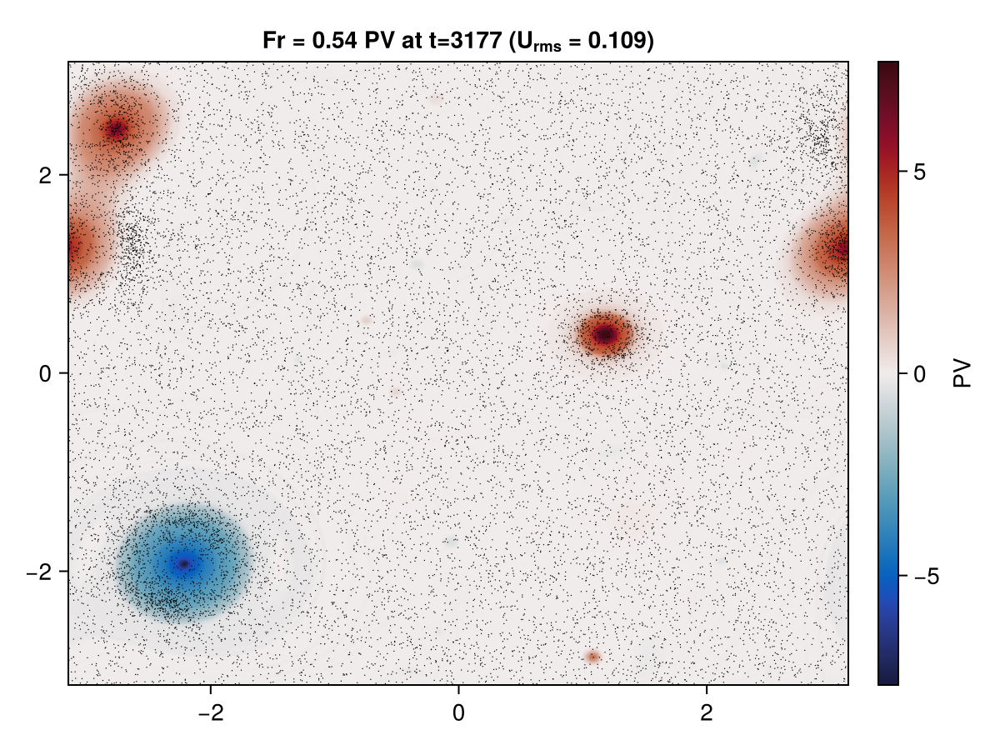

In [26]:
run_idx = 2
run_directory = data_directory * string(run_idx)
grid = TwoDGrid(Lx = 2π, nx = 512)
Nsnapshots = count_snapshots(run_directory)
Nqgsnapshots = count_qgsw_snapshots(run_directory)
t, q, ψ, u, v, Kd2 = load_qgsw_snapshot(run_directory, grid, Nqgsnapshots)
(t1, x1, k1, u1) = load_snapshot(run_directory, Nsnapshots)
U_rms = sqrt.(sum(u.^2 + v.^2) / size(u, 1) / size(u, 2))
ψ_rms = sqrt.(sum(ψ.^2) / size(ψ, 1) / size(ψ, 2))

Cg = run_idx / 10
deformation_radius = 2π / Kd2
eddy_scale = ψ_rms / U_rms
println(deformation_radius)
println(eddy_scale)
println(U_rms)
q_max = maximum(abs.(q))
Fr = U_rms / Cg

fig = Figure()
ax = Axis(fig[1,1]; title=rich(@sprintf("Fr = %0.2f ", Fr), @sprintf("PV at t=%.0f (U", t), subscript("rms"), @sprintf(" = %.3f)", U_rms)))
hm = heatmap!(ax, grid.x, grid.y, q; colormap=:balance, colorrange=(-q_max, q_max))
#lines!(ax, [-eddy_scale/2, eddy_scale/2], [-3, -3], color=:black, linewidth=2, label=@sprintf("eddy scale (%0.2f)", eddy_scale))
#lines!(ax, [-deformation_radius/2, deformation_radius/2], [-2.75, -2.75], color=:red, linewidth=2, label=@sprintf("deformation scale (%0.2f)", deformation_radius))
mod_x = mod.(x1 .+ π, 2π) .- π
scatter!(ax, mod_x[:, 1], mod_x[:, 2], markersize=1, color=:black)
cbar = Colorbar(fig[1, 2], hm, label="PV")

#axislegend(ax, "")
#save(@sprintf("images/ray_concentration_PV_plot_case_%d.png", run_idx), fig)
fig

In [27]:
function estimate_pdf(data, query_point, kernel, bandwidth)
    pointwise_contribution = sample -> kernel((sample - query_point)/bandwidth)
    return sum(pointwise_contribution, data)/length(data)/bandwidth
end

function gaussian_kernel(x)
    return 1/sqrt(2π)*exp(-x^2/2)
end

function epanechnikov_kernel(x)
    return (abs(x) <= 1) * 3/4. * (1-x^2)
end

function estimate_pdfV2(rel_freq, doppler_shift)
    abs_freq = rel_freq + doppler_shift
    
    μ_abs = sum(abs_freq) / length(abs_freq)
    σ_abs = sqrt(sum((abs_freq .- μ_abs).^2)/(length(abs_freq)-1))
    abs_bandwidth = 1.06 * σ_abs * length(rel_freq)^(-1/5) + 1e-2
    
    μ_rel = sum(rel_freq) / length(abs_freq)
    σ_rel = sqrt(sum((rel_freq .- μ_rel).^2)/(length(abs_freq)-1))
    rel_bandwidth = 1.06 * σ_rel * length(rel_freq)^(-1/5) + 1e-2
    
    query_start = minimum(rel_freq)
    query_end = maximum(rel_freq)
    Npoints = 10000
    
    linspace = (0:(Npoints-1))/(Npoints-1)
    #query_points = @. exp(log(query_start) + log(query_end-query_start)*linspace)
    query_points = @. query_start + (query_end - query_start)*linspace

    rel_pdf = estimate_pdf.(Ref(rel_freq), query_points, gaussian_kernel, rel_bandwidth)
    abs_pdf = estimate_pdf.(Ref(abs_freq), query_points, gaussian_kernel, abs_bandwidth)
    return query_points, rel_pdf, abs_pdf
end

function estimate_pdf(rel_freq, doppler_shift)
    abs_freq = rel_freq + doppler_shift
    
    μ_abs = sum(abs_freq) / length(abs_freq)
    σ_abs = sqrt(sum((abs_freq .- μ_abs).^2)/(length(abs_freq)-1))
    abs_bandwidth = 1.06 * σ_abs * length(rel_freq)^(-1/5) + 1e-2
    
    μ_rel = sum(rel_freq) / length(abs_freq)
    σ_rel = sqrt(sum((rel_freq .- μ_rel).^2)/(length(abs_freq)-1))
    rel_bandwidth = 1.06 * σ_rel * length(rel_freq)^(-1/5) + 1e-2
    
    query_start = minimum(rel_freq)
    query_end = maximum(rel_freq)
    Npoints = length(rel_freq)
    
    linspace = (0:(Npoints-1))/(Npoints-1)
    #query_points = @. exp(log(query_start) + log(query_end-query_start)*linspace)
    query_points = @. query_start + (query_end - query_start)*linspace

    rel_pdf = estimate_pdf.(Ref(rel_freq), query_points, gaussian_kernel, rel_bandwidth)
    abs_pdf = estimate_pdf.(Ref(abs_freq), query_points, gaussian_kernel, abs_bandwidth)
    return query_points, rel_pdf, abs_pdf
end

function compute_ω(k, f, Cg)
    return sqrt.(f^2 .+ Cg^2*(k[:,1].^2 + k[:,2].^2))
end

function compute_doppler_shift(k, u)
    return @. k[:,1] * u[:,1] + k[:,2] * u[:,2]
end

function compute_Ω(k, u, f, Cg)
    return compute_ω(k, f, Cg) + compute_doppler_shift(k, u)
end

compute_Ω (generic function with 2 methods)

In [3]:
# Calculate raytracing statistics

grid = TwoDGrid(Lx = 2π, nx = 512)
#data_directory = "/scratch/nad9961/swqg/58025661" # Long time run
#data_directory = "/scratch/nad9961/swqg/58031124" # Very low Froude number runs
#run_idx = 6

run_idx = 7
data_directory = "/scratch/nad9961/swqg/58628043/" # Very long run with many packets

println(data_directory)
run_directory = data_directory * string(i)
N_snapshots = count_snapshots(run_directory)
times = zeros(N_snapshots)
abs_slopes = zeros(N_snapshots)
rel_slopes = zeros(N_snapshots)
for j=1000:20:1200
    (t, x, k, u) = load_snapshot(data_directory * string(i), j)
    
    Npackets = size(x, 1)
    
    sqrtgH = i/10
    f = 3.0 * sqrtgH
    ω = sqrt.(f^2 .+ sqrtgH^2*sum(k.^2; dims=2))[:]
    doppler_shift = u[:,1] .* k[:,1] + u[:,2] .* k[:,2]
    ω1_abs = ω + doppler_shift
    times[j] = t
    ω_i, ω_pdf, ω_abs_pdf = estimate_pdf(ω, doppler_shift)
    abs_E = abs.(ω_i .* ω_abs_pdf)
    rel_E = ω_i .* ω_pdf
    p0 = [1.0, f, 10.0, -4.0]
    abs_fit = curve_fit(matern_model, ω_i, abs_E, p0)
    rel_fit = curve_fit(matern_model, ω_i, rel_E, p0)
    abs_slopes[j] = abs_fit.param[4]
    rel_slopes[j] = rel_fit.param[4]
end

/scratch/nad9961/swqg/58628043/


LoadError: UndefVarError: `i` not defined

In [38]:
print(data_directory)

/scratch/nad9961/swqg/57615490/

In [5]:
include("AnalysisUtils.jl")
grid = TwoDGrid(Lx = 2π, nx = 512)
#run_idx = 5
#data_directory = "/scratch/nad9961/swqg/58025661/" # Long time run
#data_directory = "/scratch/nad9961/swqg/58031124/" # Very low Froude number runs

run_idx = 7
data_directory = "/scratch/nad9961/swqg/58628043/" # Very long run with many packets

run_directory = data_directory * string(run_idx)

f0, Cg, freq_sign = read_parameters(run_directory)
N_snapshots = count_snapshots(run_directory)

packet_times = zeros(N_snapshots)
snap_idxs = zeros(N_snapshots)

rms_freq = zeros(N_snapshots)
mean_freq = zeros(N_snapshots)
mean_abs_freq = zeros(N_snapshots)
mean_dop = zeros(N_snapshots)
rms_U = zeros(N_snapshots)

Npackets = length(freq_sign)

time_fn(t, x, k, u) = t
rms_freq_fn(t, x, k, u) = sqrt(sum(compute_ω(k, f0, Cg).^2)/Npackets)
mean_freq_fn(t, x, k, u) = mean(abs.(compute_ω(k, f0, Cg)))
mean_dop_fn(t, x, k, u) = mean(abs.(compute_doppler_shift(k, u)))
mean_abs_freq_fn(t, x, k, u) = mean(abs.(compute_Ω(k, u, f0, Cg, freq_sign)))
rms_u_fn(t, x, k, u) = sqrt(sum(u.^2)/Npackets)

map_snapshots(run_directory, time_fn, packet_times)
map_snapshots(run_directory, rms_freq_fn, rms_freq)
map_snapshots(run_directory, mean_freq_fn, mean_freq)
map_snapshots(run_directory, mean_abs_freq_fn, mean_abs_freq)
map_snapshots(run_directory, mean_dop_fn, mean_dop)
map_snapshots(run_directory, rms_u_fn, rms_U)

error in running finalizer: ErrorException("task switch not allowed from inside gc finalizer")
ijl_error at /cache/build/builder-amdci4-4/julialang/julia-release-1-dot-10/src/rtutils.c:41
ijl_switch at /cache/build/builder-amdci4-4/julialang/julia-release-1-dot-10/src/task.c:636
try_yieldto at ./task.jl:935
wait at ./task.jl:1009
#wait#645 at ./condition.jl:130
wait at ./condition.jl:125 [inlined]
slowlock at ./lock.jl:156
lock at ./lock.jl:147 [inlined]
close at ./iostream.jl:42
close at /ext3/pkgs/packages/JLD2/OP0XX/src/mmapio.jl:179 [inlined]
close at /ext3/pkgs/packages/JLD2/OP0XX/src/JLD2.jl:420
jld_finalizer at /ext3/pkgs/packages/JLD2/OP0XX/src/JLD2.jl:442
unknown function (ip: 0x14a5a8880db5)
_jl_invoke at /cache/build/builder-amdci4-4/julialang/julia-release-1-dot-10/src/gf.c:2895 [inlined]
ijl_apply_generic at /cache/build/builder-amdci4-4/julialang/julia-release-1-dot-10/src/gf.c:3077
run_finalizer at /cache/build/builder-amdci4-4/julialang/julia-release-1-dot-10/src/gc.c:3

70094-element Vector{Float64}:
 0.10358933359384537
 0.07656978815793991
 0.08123531192541122
 0.08584989607334137
 0.08832460641860962
 0.08650752902030945
 0.08506344258785248
 0.08033125847578049
 0.07501465082168579
 0.07175061106681824
 0.07175299525260925
 0.07444888353347778
 0.07865253835916519
 ⋮
 0.06139958277344704
 0.06140555068850517
 0.06141091510653496
 0.061415378004312515
 0.061417777091264725
 0.061417318880558014
 0.06141437962651253
 0.061409980058670044
 0.06140463799238205
 0.061398427933454514
 0.06139166280627251
 0.061385150998830795

In [6]:
println(mean(rms_U./Cg))

0.127194664027827


In [7]:
diag_t, KE, PE, Z = get_diagnostics(run_directory)
qgsw_times = get_qgsw_times(run_directory)

7010-element Vector{Float64}:
     0.0
   419.0890808105469
   429.0671081542969
   439.0451354980469
   449.0231628417969
   459.0011901855469
   468.9792175292969
   478.9572448730469
   488.9352722167969
   498.9132995605469
   508.8913269042969
   518.869384765625
   528.847412109375
     ⋮
 69098.078125
 69117.140625
 69136.203125
 69155.265625
 69174.328125
 69193.390625
 69212.453125
 69231.515625
 69250.578125
 69269.640625
 69288.703125
 69307.765625

In [8]:
mean_fig = Figure(size=(900, 1200))

mean_abs_ax = Axis(mean_fig[1,1], xticklabelsvisible=false, xticksvisible=false, title="mean absolute packet frequency")
mean_dop_ax     = Axis(mean_fig[2,1], xticklabelsvisible=false, xticksvisible=false, title="mean |doppler shift|")
mean_freq_ax     = Axis(mean_fig[3,1], xticklabelsvisible=false, xticksvisible=false, title="mean |intrinsic packet frequency|")
KE_ax       = Axis(mean_fig[4,1], 
                xminorticks=IntervalsBetween(10), xminorticksvisible=true, xticks=0:500:8000, xticklabelrotation=π/3, xlabel="time", 
                title="Total background flow KE")

linkxaxes!(mean_abs_ax, mean_ax)
linkxaxes!(mean_ax, KE_ax)

mean_rms_U = mean(rms_U)
Fr = mean_rms_U / Cg
critical_time = 1/f0/Fr^2 + packet_times[2]

lines!(mean_abs_ax, packet_times[2:end], mean_abs_freq[2:end], color=:black)
lines!(mean_freq_ax, packet_times[2:end], mean_freq[2:end], color=:black)
lines!(mean_dop_ax, packet_times[2:end], mean_dop[2:end], color=:black)
#lines!(mean_ax, packet_times, mean_dop)
#lines!(mean_ax, [critical_time, critical_time], [0, 4])
lines!(KE_ax, diag_t, grid.Lx^2 * KE, color=:red, label="Total KE")
#lines!(mean_ax, diag_t, 10 * grid.Lx^2 * PE, color=:blue)
mean_fig

LoadError: UndefVarError: `mean_ax` not defined

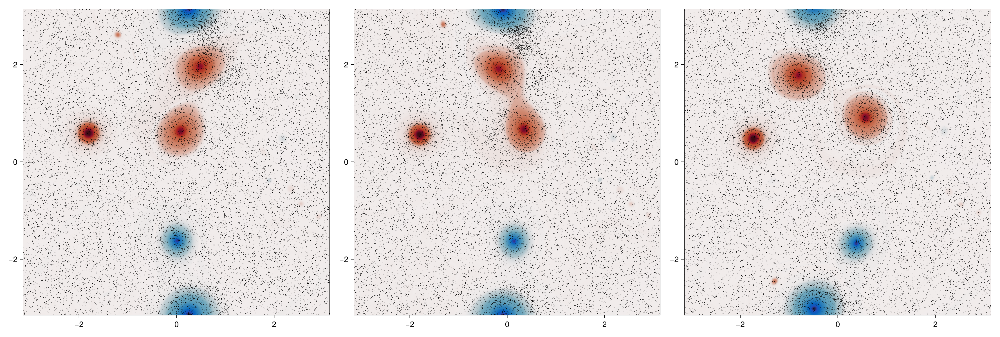

In [69]:
idx1 = findfirst(>=(1990), qgsw_times)
idxp1 = findfirst(>=(1990), packet_times)
idx2 = findfirst(>=(2000), qgsw_times)
idxp2 = findfirst(>=(2000), packet_times)
idx3 = findfirst(>=(2020), qgsw_times)
idxp3 = findfirst(>=(2020), packet_times)

snap_fig = Figure(size=(1200, 600))

snap_ax1 = Axis(snap_fig[1,1])
snap_ax2 = Axis(snap_fig[1,2])
snap_ax3 = Axis(snap_fig[1,3])

reset(x) = @. mod(x + grid.Lx/2, grid.Lx) - grid.Lx/2
t1, q1, _, _, _, _ = load_qgsw_snapshot(run_directory, grid, idx1)
_, x1, _, u1 = load_snapshot(run_directory, idxp1)
x1 = reset(x1)

t2, q2, _, _, _, _ = load_qgsw_snapshot(run_directory, grid, idx2)
_, x2, _, u2 = load_snapshot(run_directory, idxp2)
x2 = reset(x2)

t3, q3, _, _, _, _ = load_qgsw_snapshot(run_directory, grid, idx3)
_, x3, _, u3 = load_snapshot(run_directory, idxp3)
x3 = reset(x3)

heatmap!(snap_ax1, grid.x, grid.y, q1, colormap=:balance)
scatter!(snap_ax1, x1[:,1], x1[:,2], markersize=1.5, color=:black)

heatmap!(snap_ax2, grid.x, grid.y, q2, colormap=:balance)
scatter!(snap_ax2, x2[:,1], x2[:,2], markersize=1.5, color=:black)

heatmap!(snap_ax3, grid.x, grid.y, q3, colormap=:balance)
scatter!(snap_ax3, x3[:,1], x3[:,2], markersize=1.5, color=:black)


colsize!(snap_fig.layout, 1, Aspect(1, 1))
colsize!(snap_fig.layout, 2, Aspect(1, 1))
colsize!(snap_fig.layout, 3, Aspect(1, 1))
resize_to_layout!(snap_fig)
snap_fig

In [22]:
idx = Observable(1)
result = @lift load_qgsw_snapshot(run_directory, grid, $idx)
snap_t = @lift $result[1]
snap_q = @lift $result[2]

title = @lift @sprintf("t = %0.2f", $snap_t)
idxp = @lift findfirst(>=($snap_t), packet_times)
packet_result = @lift load_snapshot(run_directory, $idxp)
packet_xs = @lift $packet_result[2]
packet_x = @lift reset($packet_xs[:,1])
packet_y = @lift reset($packet_xs[:,2])

movie_fig = Figure()
movie_ax = Axis(movie_fig[1,1], title=title)
heatmap!(movie_ax, grid.x, grid.y, snap_q)
scatter!(movie_ax, packet_x, packet_y, color=:black, markersize=1)

N_snapshots = count_qgsw_snapshots(run_directory)
snap_filter = 1:(N_snapshots-1)
N_filtered = length(snap_filter)
frames = 1:N_filtered

println(@sprintf("%d frames", N_filtered))
record(movie_fig, "QG_snap.mp4", frames, framerate = 5) do j
    println(@sprintf("Frame %d/%d", j, N_filtered))
    idx[] = snap_filter[j]
end

LoadError: IOError: readdir("/scratch/nad9961/swqg/5761549015"): no such file or directory (ENOENT)

In [23]:
# Calculate raytracing statistics
#data_directory = "/scratch/nad9961/swqg/53531742/"
data_directory = "/scratch/nad9961/swqg/52585523/"
data_directory = "/scratch/nad9961/swqg/57233897/"

N = 12
t_mean = 0
Fr = zeros(N)
ω_mean = zeros(N)
ω0_mean = zeros(N)
ω_var  = zeros(N)
ω_abs_mean = zeros(N)
ω0_abs_mean = zeros(N)
ω_abs_var  = zeros(N)
concentration = zeros(N)
abs_slopes = zeros(N)
rel_params = zeros(N, 4)
rel_slopes = zeros(N)
U_rmss = zeros(N)
sqrtgHs = zeros(N)
#grid = TwoDGrid(Lx = 2π, nx = 512)
for i=1:N
    println("Case ", i, ":")
    directory = data_directory * string(i)
    (t0, x0, k0, u0), (t1, x1, k1, u1) = load_first_last_frame(directory)

    t, q, ψ, u, v, Kd2 = load_last_snapshot(directory, grid)
    Npackets = size(x1, 1)
    Nbins = round(Int, sqrt(Npackets))
    
    iloc0 = floor.(Int, mod.((x0[:,1] .+ π)/(2π) * Nbins, Nbins)) .+ 1
    jloc0 = floor.(Int, mod.((x0[:,2] .+ π)/(2π) * Nbins, Nbins)) .+ 1
    bincounts0 = idxcounts(zip(iloc0, jloc0), 128)

    iloc1 = floor.(Int, mod.((x1[:,1] .+ π)/(2π) * Nbins, Nbins)) .+ 1
    jloc1 = floor.(Int, mod.((x1[:,1] .+ π)/(2π) * Nbins, Nbins)) .+ 1
    bincounts1 = idxcounts(zip(iloc1, jloc1), 128)

    concentration[i] = Npackets ./ sum(bincounts1.^2)

    f, sqrtgH = read_parameters(directory) 
    sqrtgHs[i] = sqrtgH
    
    ω0 = sqrt.(f^2 .+ sqrtgH^2*sum(k0.^2; dims=2))[:]    
    ω0_abs = ω0 + u0[:,1] .* k0[:,1] + u0[:,2] .* k0[:,2]
    ω1 = sqrt.(f^2 .+ sqrtgH^2*sum(k1.^2; dims=2))[:]
    doppler_shift1 = u1[:,1] .* k1[:,1] + u1[:,2] .* k1[:,2]
    ω1_abs = ω1 + doppler_shift1
    ω0_mean[i] = mean(ω0)
    ω0_abs_mean[i] = mean(abs.(ω0_abs))
    ω_mean[i] = mean(ω1)
    ω_var[i] = variance(ω1)
    ω_abs_mean[i] = mean(ω1_abs)
    ω_abs_var[i] = variance(ω1_abs)
    t_mean = (t1 + t_mean * (i-1))/i

    rms_U = sqrt.(sum(u.^2 + v.^2) / size(u, 1) / size(u, 2))
    rms_Cg = sqrt.(sum((sqrtgH^2 * k1 ./ ω1).^2) / size(k0, 1))
    println("√gH: ", sqrtgH)
    println("RMS Cg: ", rms_Cg)

    U_rmss[i] = rms_U
    Fr[i] = rms_U / sqrtgH

    ω_i, ω_pdf, ω_abs_pdf = estimate_pdf(ω1, doppler_shift1)
    abs_E = abs.(ω_i .* ω_abs_pdf)
    rel_E = ω_i .* ω_pdf
    p0 = [1.0, f, 10.0, -4.0]
    #abs_mask = abs_E .>= (1e-10 * maximum(abs_E))
    #rel_mask = rel_E .>= (1e-10 * maximum(rel_E))
    abs_fit = curve_fit(matern_model, ω_i, abs_E, p0)
    rel_fit = curve_fit(matern_model, ω_i, rel_E, p0)
    println("Abs Params: ", abs_fit.param)
    println("Rel Params: ", rel_fit.param)
    rel_params[i,:] = rel_fit.param
    abs_slopes[i] = abs_fit.param[4]
    rel_slopes[i] = rel_fit.param[4]

    est_E = matern_model(ω_i, abs_fit.param)
    est_rel_E = matern_model(ω_i, rel_fit.param)

    fig = Figure(fontsize=30)
    ax = Axis(fig[1,1];
        title = @sprintf("Energy spectrum for Fr = %0.3f", Fr[i]),
        xscale=log10,
        yscale=log10,
        xticks=[1, 10, 100],
        limits=((minimum(ω_i), 100), (1e-2, maximum(est_E + est_rel_E))))

    #lines!(ax, ω_i, abs_E, color=:black, label=rich("E = ω*f(ω", subscript("abs"), ")"))
    #lines!(ax, ω_i, est_E, linestyle=:dash, color=:black, label="Matern estimate")
    lines!(ax, ω_i, rel_E, color=:black, label=rich("E = ω*f(ω", subscript("rel"), ")"))
    lines!(ax, ω_i, est_rel_E, linestyle=:dash, color=:black, label="Matern estimate")
    save("images/energy_spec_" * string(i) * ".png", fig)
end

Case 1:
3177.4424
√gH: 0.35
RMS Cg: 0.327158436855396
Abs Params: [1.1122024707300204, 25.051440194851466, 7.765908675403064, -0.3284877487460207]
Rel Params: [1.6115794799614565, 22.569607194077584, 12.203137322328697, -0.35421374316130444]
Case 2:
3177.4424
√gH: 0.4
RMS Cg: 0.37004543756968006
Abs Params: [1.9767647925251604, 13.177984035877769, 6.307291354560354, -0.47395426348775904]
Rel Params: [1.8443821860163039, 12.421069208673723, 5.927782587452102, -0.4599530289193832]
Case 3:
3177.4424
√gH: 0.45
RMS Cg: 0.3991212756864879
Abs Params: [2.3567691828515165, 5.150327255885264, 3.66156389824461, -0.6310618553402259]
Rel Params: [3.477958735443805, 5.174005133059812, 4.334553156345881, -0.6898843544635648]
Case 4:
3177.4424
√gH: 0.5
RMS Cg: 0.4265024239340773
Abs Params: [2.4933498745822464, 3.7654149413867155, 2.750022144387204, -0.7201496813150954]
Rel Params: [4.540447077892676, 3.8458873184135793, 3.40341459939191, -0.8410034912866746]
Case 5:
3177.4424
√gH: 0.55
RMS Cg: 0.456

In [24]:
run_idx = 6
directory = data_directory * string(run_idx)

ωs = zeros(0)
Uk = zeros(0)
snap_idx = count_snapshots(directory)
t, x, k, u = load_snapshot(directory, snap_idx)

Cg = run_idx / 10
f0 = 3.0 * Cg

ωs = compute_ω(k, f0, Cg)
Uk = compute_doppler_shift(k, u)
ω_i, ω_pdf, _ = estimate_pdf(ωs, Uk)

#abs_E = abs.(ω_i .* ω_abs_pdf)


([1.8005033307595633, 1.8028405264178424, 1.8051777220761218, 1.807514917734401, 1.8098521133926802, 1.8121893090509593, 1.8145265047092387, 1.8168637003675179, 1.819200896025797, 1.8215380916840762  …  40.069745039423594, 40.07208223508187, 40.07441943074016, 40.076756626398435, 40.07909382205671, 40.08143101771499, 40.083768213373276, 40.08610540903155, 40.08844260468983, 40.09077980034811], [0.1701783755113099, 0.17105153106713658, 0.1719245273206974, 0.1727973260068403, 0.17366988886065027, 0.17454217762207155, 0.17541415404052876, 0.17628577987954278, 0.17715701692134336, 0.17802782697147582  …  6.738152805649995e-5, 6.740557198170455e-5, 6.742679433470054e-5, 6.744519244536111e-5, 6.74607639984427e-5, 6.747350703407043e-5, 6.748341994814933e-5, 6.749050149270064e-5, 6.749475077612401e-5, 6.74961672633843e-5], [0.18498159629824956, 0.18575662488069464, 0.18653107820463982, 0.1873049289173131, 0.18807814969602454, 0.1888507132507095, 0.18962259232646791, 0.19039375970609562, 0.1911

In [11]:
U_rmss ./ sqrtgHs

12-element Vector{Float64}:
 0.3114051382126747
 0.27247948723553145
 0.2422039986791412
 0.21798359303663375
 0.1981668984654243
 0.18165298697895363
 0.1676796931017112
 0.15570256910633734
 0.14532239535775585
 0.13623974361776572
 0.1282256393660934
 0.1211019993395706

[7.60362203742575, 3.9726086196436814, 3.5263594731370174, -0.9733065552643126]


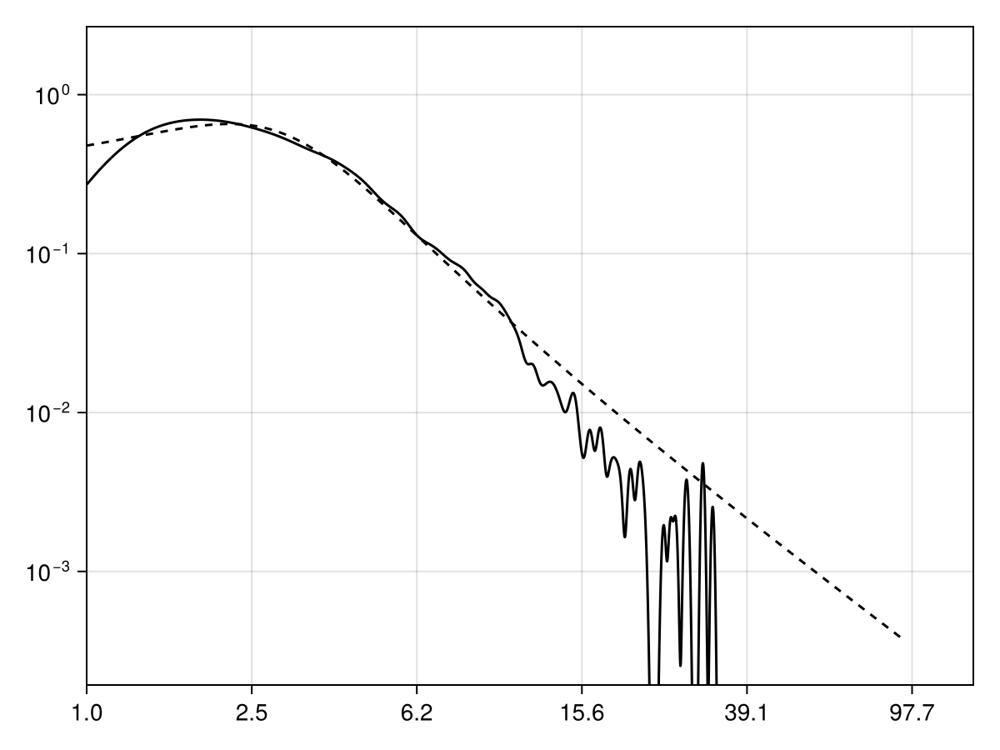

In [88]:
rel_E = ω_i .* ω_abs_pdf

#est_E = matern_model(ω_i, fit.param)
p0 = [1.0, f0, 10.0, -4.0]
log_matern_model(ω, p) = @. log(abs(p[1]) * ((ω - p[2])^2 + p[3]^2)^p[4])
#println(log_matern_model(ω_i, p0))
#mask = @. 2 <= ω_i/f0 <= 40
#rel_fit = curve_fit(log_matern_model, ω_i[mask], log.(rel_E)[mask], p0)
rel_fit = curve_fit(matern_model, ω_i, rel_E, p0)
est_rel_E = matern_model(ω_i, rel_fit.param)
println(rel_fit.param)

fig = Figure()
ax = Axis(fig[1,1];
    xscale=log10,
    yscale=log10,
    xtickformat = "{:.1f}",
    xticks = [1, 2.5, 2.5^2, 2.5^3, 2.5^4, 2.5^5],
    limits=((1, 1.5*maximum(ω_i)/f0), (minimum(est_rel_E)/2, 2*maximum(est_rel_E + rel_E))))

#lines!(ax, ω_i, E_i, color=:black)
#lines!(ax, ω_i, est_E, linestyle=:dash, color=:black)
lines!(ax, ω_i/f0, rel_E, color=:black)
lines!(ax, ω_i/f0, est_rel_E, linestyle=:dash, color=:black)
fig

In [68]:
zeros(0)

Float64[]

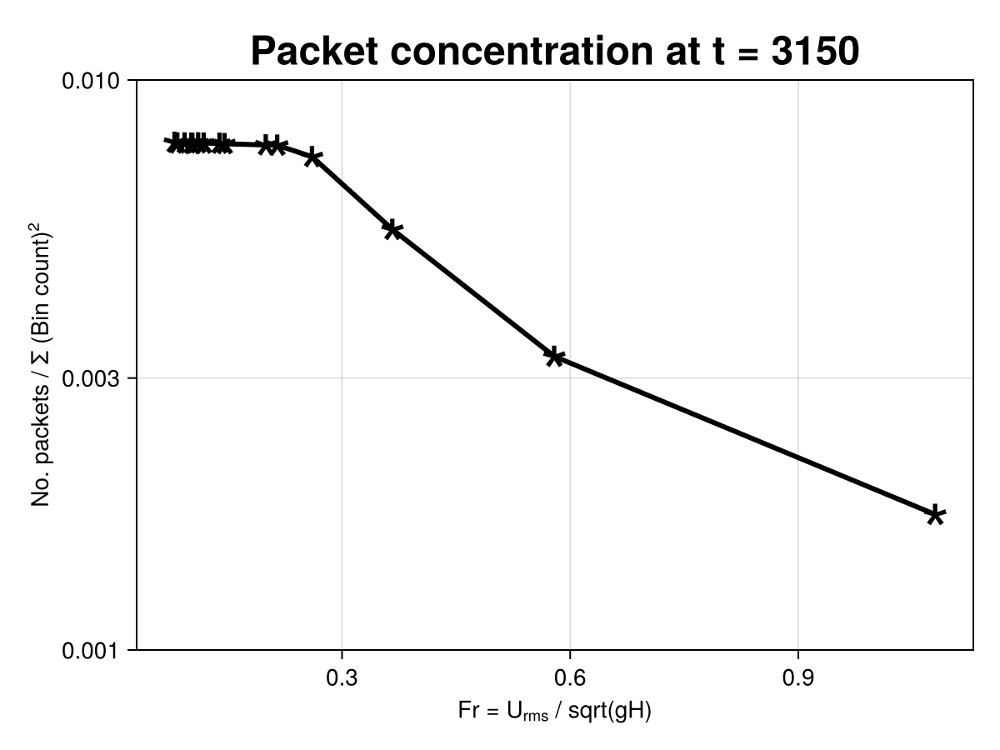

In [25]:
fig = Figure()
ax = Axis(fig[1,1];
    title = @sprintf("Packet concentration at t = %.0f", t_mean),
    titlesize=24,
    xlabel=rich("Fr = U", subscript("rms"), " / sqrt(gH)"),
    yscale = log10,
    ylabel = rich("No. packets / Σ (Bin count)", superscript("2")),
    yticks = [0.001, 0.003, 0.01, 1],
    limits = ((nothing, nothing), (0.001, 0.01)))

scatterlines!(ax, Fr, (concentration), linewidth=3, color="black", marker='*', markersize=45)

save("images/concentration.png", fig)

fig

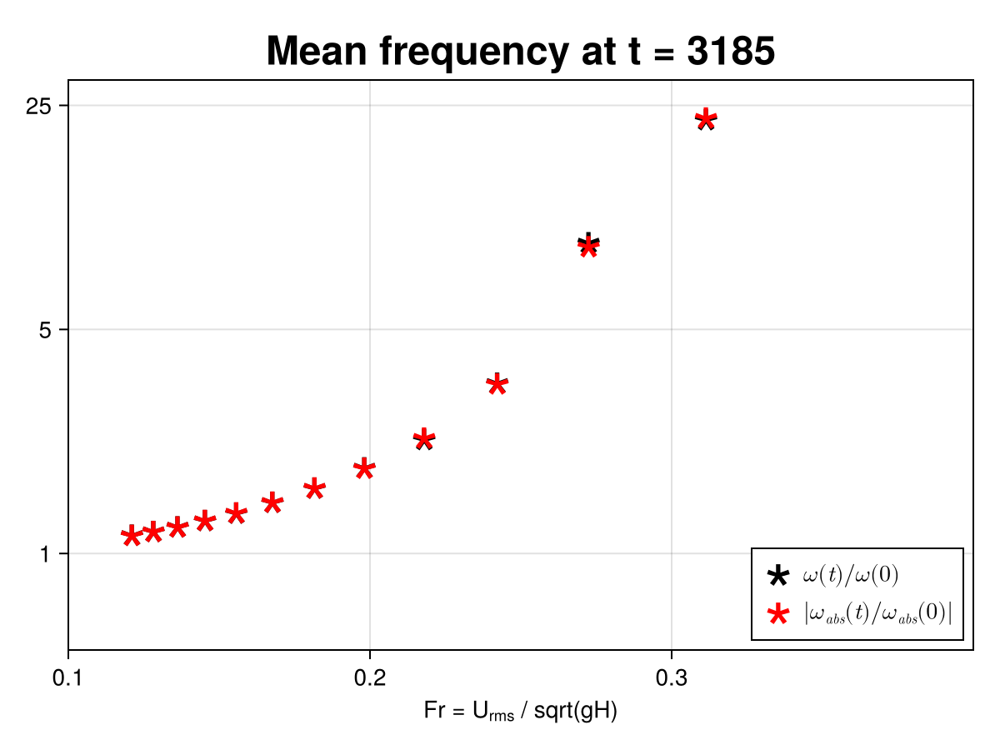

In [58]:
fig = Figure()
ax = Axis(fig[1,1];
    title = @sprintf("Mean frequency at t = %.0f", t_mean),
    titlesize=24,
    xlabel=rich("Fr = U", subscript("rms"), " / sqrt(gH)"),
    yscale=log10,
    xticks = [0.1, 0.2, 0.3],
    yticks = [1, 5, 25],
    limits = ((0.10, 0.4), (0.5, 30)))

ω_std = sqrt.(ω_var) ./ ω0_mean
ω_abs_std = sqrt.(ω_abs_var)  ./ ω0_abs_mean

scatter!(ax, U_rmss ./ sqrtgHs, ω_mean ./ ω0_mean, label=L"ω(t) / ω(0)", color="black", marker='*', markersize=45)
#errorbars!(ax, U_rmss ./ sqrtgHs, ω_mean ./ ω0_mean, ω_std, color="black")
scatter!(ax, U_rmss ./ sqrtgHs, abs.(ω_abs_mean)./ ω0_abs_mean, label=L"|ω_{abs}(t) / ω_{abs}(0)|", color="red", marker='*', markersize=45)
#errorbars!(ax, U_rmss ./ sqrtgHs,  abs.(ω_abs_mean)./ ω0_abs_mean, ω_abs_std, color="red")

axislegend(ax, position=:rb)
save("images/52585523_mean_freq.png", fig)

fig

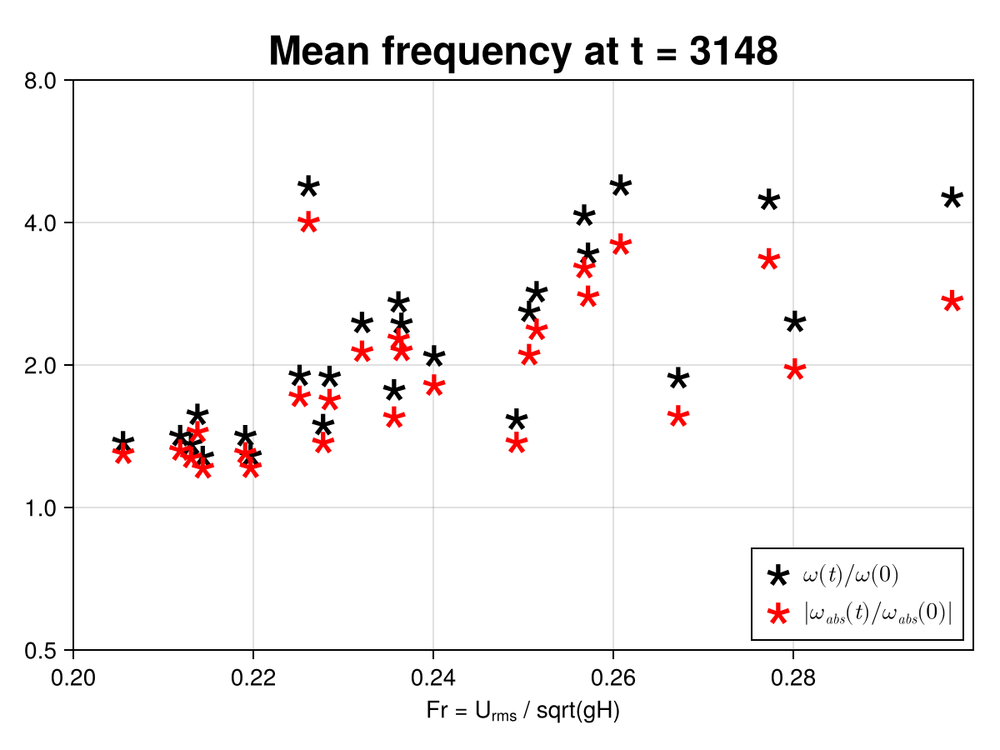

In [31]:
fig = Figure()
ax = Axis(fig[1,1];
    title = @sprintf("Mean frequency at t = %.0f", t_mean),
    titlesize=24,
    xlabel=rich("Fr = U", subscript("rms"), " / sqrt(gH)"),
    yscale = log10,
    yticks = [0.5, 1, 2, 4, 8],
    limits = ((0.2, 0.3), (0.5, 8)))

scatter!(ax, Fr, ω_mean, label=L"ω(t) / ω(0)", color="black", marker='*', markersize=45)
scatter!(ax, Fr, abs.(ω_abs_mean), label=L"|ω_{abs}(t) / ω_{abs}(0)|", color="red", marker='*', markersize=45)

axislegend(ax, position=:rb)
#save("images/mean_freq.png", fig)

fig

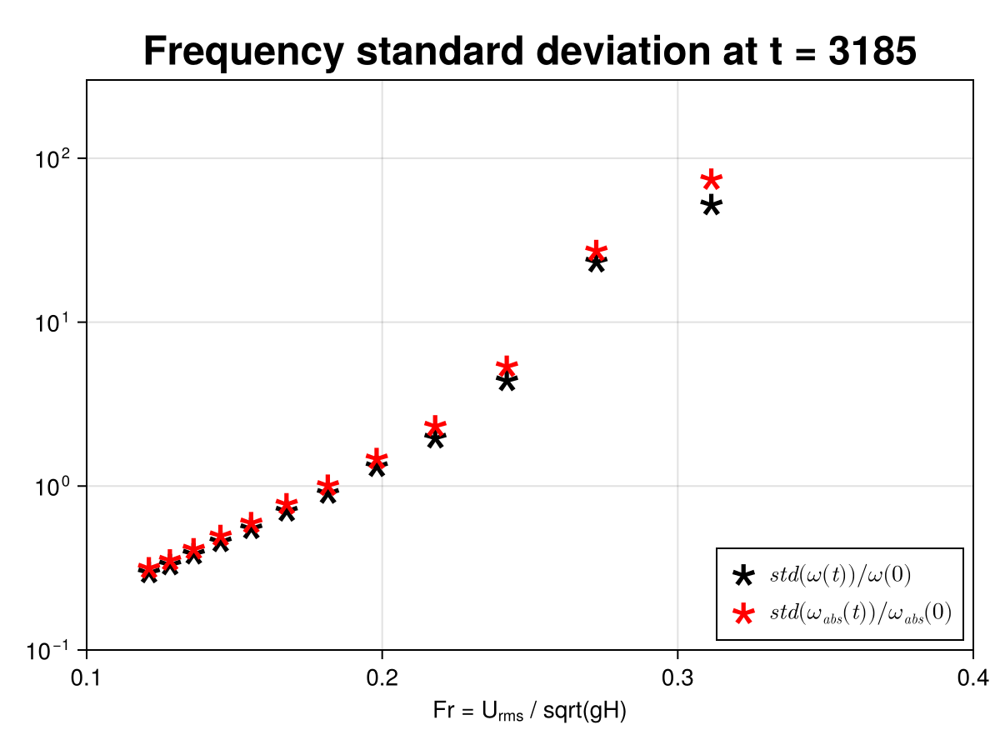

In [47]:
fig = Figure()
ax = Axis(fig[1,1];
    title = @sprintf("Frequency standard deviation at t = %.0f", t_mean),
    titlesize=24,
    xlabel=rich("Fr = U", subscript("rms"), " / sqrt(gH)"),
    xticks = [0.1, 0.2, 0.3, 0.4],
    #yticks = [0.5, 1, 2, 3, 4],
    yscale=log10,
    limits = ((0.10, 0.4), (0.1, 300)))

scatter!(ax, U_rmss ./ sqrtgHs, sqrt.(ω_var) ./ ω0_mean, label=L"std(ω(t))/ω(0)", color="black", marker='*', markersize=45)
scatter!(ax, U_rmss ./ sqrtgHs, sqrt.(ω_abs_var) ./ ω0_abs_mean, label=L"std(ω_{abs}(t))/ω_{abs}(0)", color="red", marker='*', markersize=45)

axislegend(ax, position=:rb)
save("images/52585523_var_freq.png", fig)

fig

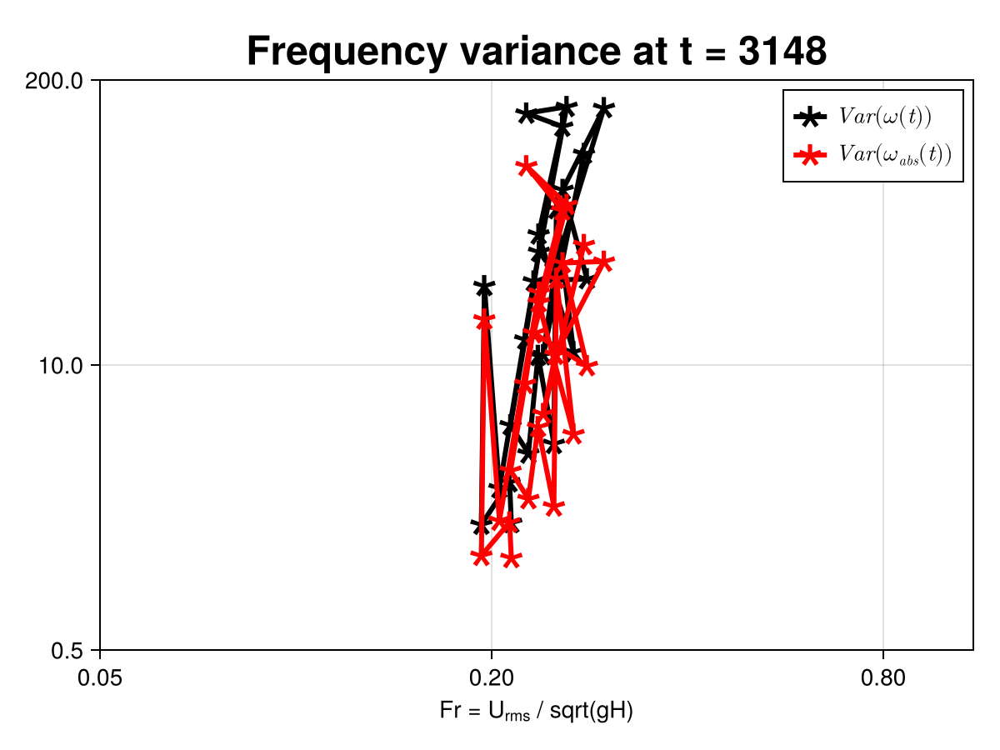

In [123]:
fig = Figure()
ax = Axis(fig[1,1];
    title = @sprintf("Frequency variance at t = %.0f", t_mean),
    titlesize=24,
    xlabel=rich("Fr = U", subscript("rms"), " / sqrt(gH)"),
    xscale = log10, 
    xticks = [0.05, 0.2, 0.8],
    yscale = log10,
    yticks = [0.5, 10, 200],
    limits = ((0.05, 1.1), (0.5, 200)))

scatterlines!(ax, Fr, ω_var, label=L"Var(ω(t))", linewidth=3, color="black", marker='*', markersize=45)
scatterlines!(ax, Fr, ω_abs_var, label=L"Var(ω_{abs}(t))", linewidth=3, color="red", marker='*', markersize=45)

axislegend(ax)
save("images/var_log_freq.png", fig)

fig

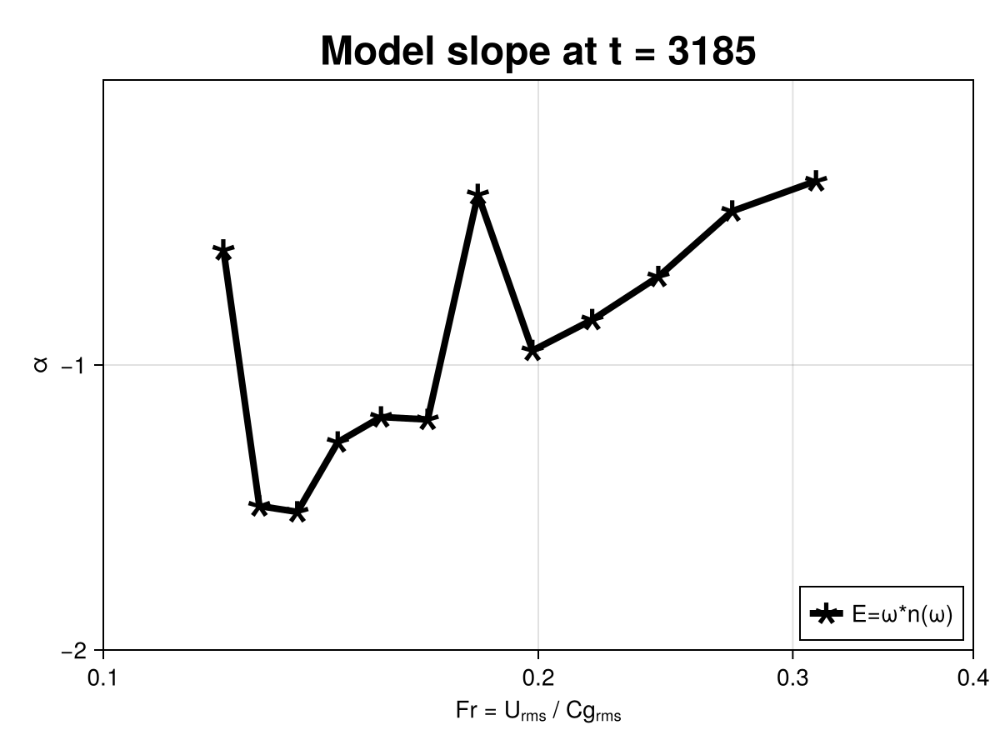

In [50]:
fig = Figure()
ax = Axis(fig[1,1];
    title = @sprintf("Model slope at t = %.0f", t_mean),
    titlesize=24,
    xscale=log10,
    xlabel=rich("Fr = U", subscript("rms"), " / Cg", subscript("rms")),
    ylabel = rich("α"),
    xticks = [0.1, 0.2, 0.3, 0.4],
    yticks = [-3, -2, -1],
    limits = ((0.1, 0.4), (-2, 0)))

#scatter!(ax, Fr, abs_slopes, color="red", marker='*', markersize=45, label="E=ω*n(ω_abs)")
scatterlines!(ax, U_rmss ./ sqrtgHs, rel_slopes, color="black", linewidth=4, marker='*', markersize=45, label="E=ω*n(ω)")
#scatter!(ax, Fr, rel_slopes, color="black", marker='*', markersize=45, label="E=ω*n(ω)")
axislegend(ax; position=:rb)

save("images/52585523_full_pred_slope.png", fig)

fig

[0.10800886572671685, 0.11583188573285849, 0.10990589027881896, 0.10429742753302786, 0.10749348649841152, 0.11995451982547872, 0.10201389473188872, 0.11131776879321274, 0.09991850290698458, 0.11831515818062567]


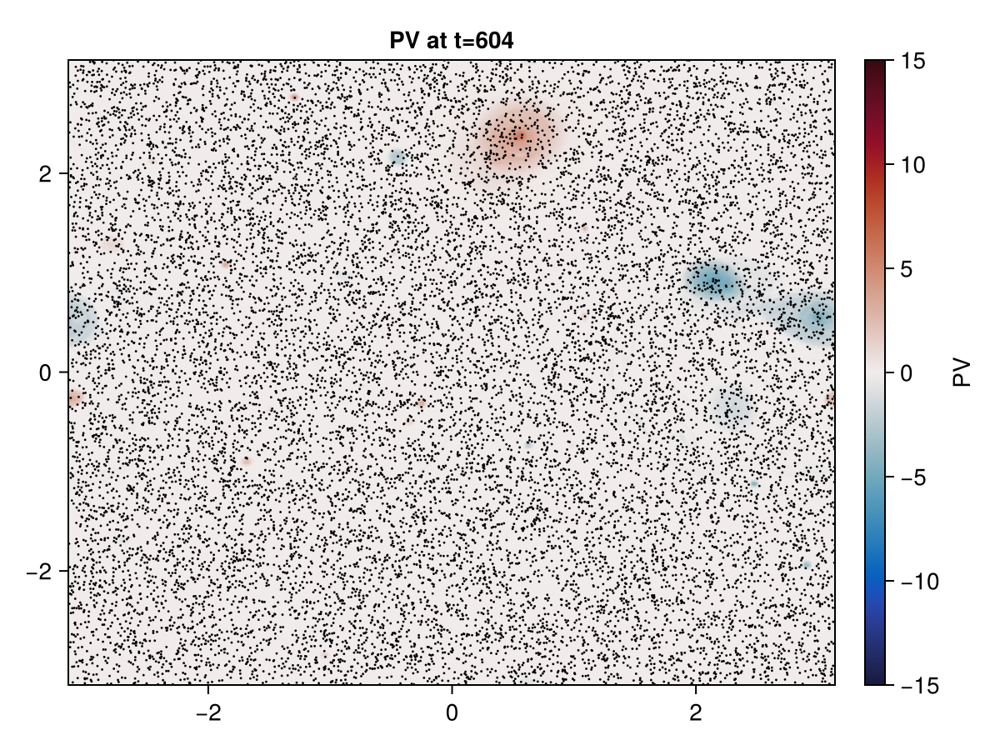

In [23]:
run_idx = 6

grid = TwoDGrid(Lx = 2π, nx = 512)

packet_idx = Observable(6)
qg_idx = Observable(2)

QG_frames = count_qgsw_snapshots(run_directory)
packet_frames = count_snapshots(run_directory)

qg_snap0 = @lift load_qgsw_snapshot(run_directory, grid, $qg_idx)
qg_snap1 = @lift load_qgsw_snapshot(run_directory, grid, $qg_idx+1)
ts0 = @lift $qg_snap0[1]
q0  = @lift $qg_snap0[2]
ts1 = @lift $qg_snap1[1]
q1  = @lift $qg_snap1[2]
Kd2 = qg_snap0[][6]

packet_snap = @lift load_snapshot(run_directory, $packet_idx)
tp = @lift $packet_snap[1]
xp = @lift $packet_snap[2]

α = @lift (($tp - $ts0) / ($ts1 - $ts0))
q = @lift (1 - $α) * $q0 + $α * $q1
q_max = @lift maximum(abs.($q))
colorrange=@lift (-$q_max, $q_max)

title = @lift rich(@sprintf("PV at t=%.0f", $tp))

fig = Figure()
ax = Axis(fig[1,1]; title=title)
hm = heatmap!(ax, grid.x, grid.y, q; colormap=:balance, colorrange=(-15, 15))
mod_x = @lift mod.($xp .+ π, 2π) .- π
scatter!(ax, @lift($mod_x[:, 1]), @lift($mod_x[:, 2]), markersize=2, color=:black)
cbar = Colorbar(fig[1, 2], hm, label="PV")

frames = 5:1000
CairoMakie.record(fig, "movies/qgsw_particles.mp4", frames, framerate=10) do idx
    packet_idx[] = idx
    if tp[] >= ts1[]
        qg_idx[] += 1
    end
end
fig

In [ ]:
run_idx = 6
grid = TwoDGrid(Lx = 2π, nx = 512)
t, q, ψ, u, v, Kd2 = load_qgsw_snapshot(data_directory * string(run_idx), grid, 6)
(t0, x0, k0, u0), (t1, x1, k1, u1) = load_snapshot(data_directory * string(run_idx))
U_rms = sqrt.(sum(u.^2 + v.^2) / size(u, 1) / size(u, 2))
ψ_rms = sqrt.(sum(ψ.^2) / size(ψ, 1) / size(ψ, 2))

Cg = run_idx / 10
deformation_radius = 2π / Kd2
eddy_scale = ψ_rms / U_rms
println(deformation_radius)
println(eddy_scale)
println(U_rms)
q_max = maximum(abs.(q))
Fr = U_rms / Cg

fig = Figure()
ax = Axis(fig[1,1]; title=rich(@sprintf("Fr = %0.2f ", Fr), @sprintf("PV at t=%.0f (U", t), subscript("rms"), @sprintf(" = %.3f)", U_rms)))
hm = heatmap!(ax, grid.x, grid.y, q; colormap=:balance, colorrange=(-q_max, q_max))
#lines!(ax, [-eddy_scale/2, eddy_scale/2], [-3, -3], color=:black, linewidth=2, label=@sprintf("eddy scale (%0.2f)", eddy_scale))
#lines!(ax, [-deformation_radius/2, deformation_radius/2], [-2.75, -2.75], color=:red, linewidth=2, label=@sprintf("deformation scale (%0.2f)", deformation_radius))
mod_x = mod.(x1 .+ π, 2π) .- π
scatter!(ax, mod_x[:, 1], mod_x[:, 2], markersize=1, color=:black)
cbar = Colorbar(fig[1, 2], hm, label="PV")

#axislegend(ax, "")
save(@sprintf("images/ray_concentration_PV_plot_case_%d.png", run_idx), fig)
fig

In [ ]:
t = t2
x = x2
k = k2
u = u2
f0 = f02
Cg = Cg2

ω  = @. sqrt(f0^2 + Cg^2*(k[:,:,1]^2 + k[:,:,2]^2))# + u[:,:,1]*k[:,:,1] + u[:,:,2]*k[:,:,2]
ω₀ = @. sqrt(f0^2 + Cg^2*(k[1,:,1]^2 + k[1,:,2]^2))# + u[1,:,1]*k[1,:,1] + u[1,:,2]*k[1,:,2]
ω_abs  = @. abs.(sqrt(f0^2 + Cg^2*(k[:,:,1]^2 + k[:,:,2]^2)) + u[:,:,1]*k[:,:,1] + u[:,:,2]*k[:,:,2])


f = Figure(size=(1000, 600), fontsize=24)
ax = Axis(f[1,1]; xscale=log10, yscale=log10, xticks=[1, 10], yticks=[1e-2, 1e-1, 1, 10], limits=((1, 100), (1e-3, 10)),
 title = "Energy spectrum",
 xlabel = "ω/f",
 ylabel = "Energy",
 xminorticks = IntervalsBetween(10),
 xminorticksvisible=true,
 yminorticks = IntervalsBetween(10),
 yminorticksvisible=true)
#bandwidths = 0.1:0.3:1.2
#bandwidths = 0.01:0.01:0.05
idxs = 1:200:size(ω,1)
println(length(idxs))
for idx=idxs
    data = (ω[idx, :][:]/f0)
    query_points, pdf = compute_plot_data(data)
    lines!(ax, query_points, query_points .* pdf, color="blue", alpha=1e-1 + 0.9*(idx/size(ω,1))^(100), linewidth=2)
    #scatter!(ax, data, 1e-2 .* ones(length(data)), marker=:vline, markersize=10)
end

lines!(ax, ω₀[1]*ones(2)/f0, [1e-3, 10], color="black", linewidth=1, label="ft = 0")  

idxs = 250:ceil(Int, size(ω, 1)/4):size(ω, 1)
colors = ["#000000", "#ffdede", "#ff8989", "#ff5656", "#ff0000"]
for i=1:length(idxs)
    idx = idxs[i]
    data = ω[idx, :][:]/f0
    query_points, pdf = compute_plot_data(data)
    lines!(ax, query_points, query_points .* pdf, linewidth=2, color=colors[i], label=@sprintf("ft=%.0f", floor(t[idx]/10)*10))
end

ω_trend = f0:0.1:(maximum(ω))
slope = -2.00
GM_trend = @. (ω_trend^2 + f0^2)/ω_trend * (f0/ω_trend*(ω_trend^2-f0^2)^(-1/2))
linear_trend = (ω₀[1]/f0)*(1.)^(slope)*ω_trend.^(slope)

lines!(ax, ω_trend/f0, GM_trend, color="gray", linestyle=:solid, label="GM Spectrum"; linewidth=2)
lines!(ax, ω_trend/f0, linear_trend, color="black", linestyle=:dash, label=rich("ω", superscript(@sprintf("%.2f", slope))); linewidth=2)

axislegend(ax)

f

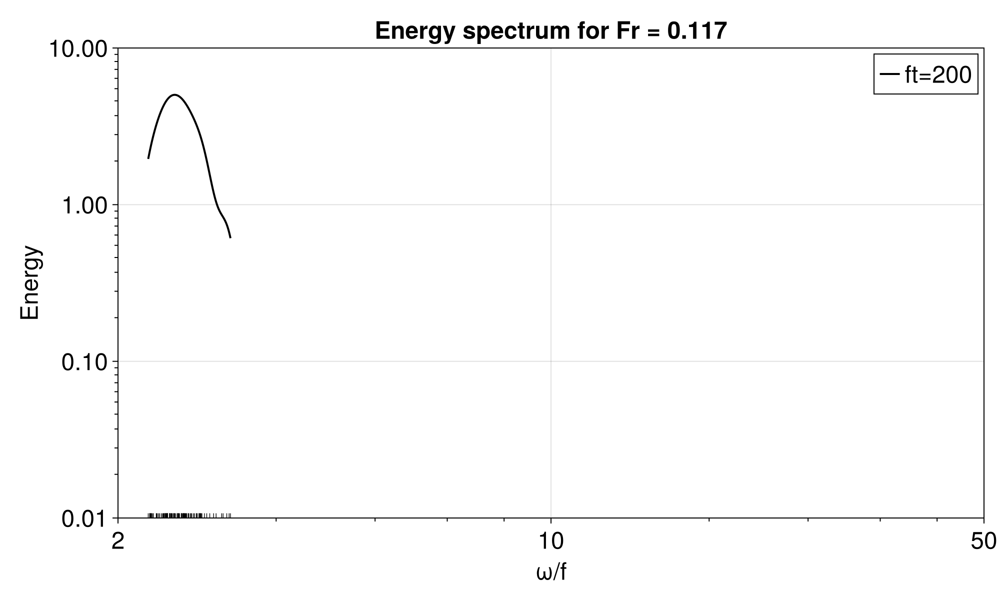

In [62]:
# Calculate raytracing statistics
data_directory = "/scratch/nad9961/swqg/53531742/"
#data_directory = "/scratch/nad9961/swqg/52585523/"
run = 14
directory = data_directory * string(run)
Nsnaps = count_snapshots(directory)
Nlines = 5
colors = ["#000000", "#ffdede", "#ff8989", "#ff5656", "#ff0000"]

fig = Figure(size=(1000, 600), fontsize=24)
ax = Axis(fig[1,1]; 
    xscale=log10, 
    yscale=log10, 
    xticks=[2, 10, 50], 
    yticks=[1e-2, 1e-1, 1, 10],
    limits=((2, 50), (1e-2, 10)),
    title = @sprintf("Energy spectrum for Fr = %0.3f", Fr[run]),
    xlabel = "ω/f",
    ylabel = "Energy",
    xminorticks = IntervalsBetween(5),
    xminorticksvisible=true,
    yminorticks = IntervalsBetween(10),
    yminorticksvisible=true)

for i=0:(Nlines-1)
    idx = floor(Int, i * Nsnaps/Nlines) + 2
    directory = data_directory * string(run)
    t, x, k, u = load_snapshot(directory, idx)

    Npackets = size(x, 1)

    f, sqrtgH = read_parameters(directory)
    
    ωs = compute_ω(k, f, sqrtgH)   
    doppler_shift = compute_doppler_shift(k, u)

    ω_i, ω_pdf, ω_abs_pdf = estimate_pdf(ωs, doppler_shift)
    abs_E = abs.(ω_i .* ω_abs_pdf)
    rel_E = ω_i .* ω_pdf
    #abs_mask = abs_E .>= (1e-10 * maximum(abs_E))
    #rel_mask = rel_E .>= (1e-10 * maximum(rel_E))

    #lines!(ax, ω_i, abs_E, color=:black, label=rich("E = ω*f(ω", subscript("abs"), ")"))
    #lines!(ax, ω_i, est_E, linestyle=:dash, color=:black, label="Matern estimate")
    #scatter!(ax, ωs, 0.01*ones(size(ωs[1:100])), marker='|', color=colors[i+1], markersize=10)
    lines!(ax, ω_i, rel_E, linewidth=2, color=colors[i+1], label=@sprintf("ft=%.0f", floor(t/10)*10))
    #save("images/fine_grain_energy_spec_" * string(i) * ".png", fig)
end
axislegend(ax)
fig

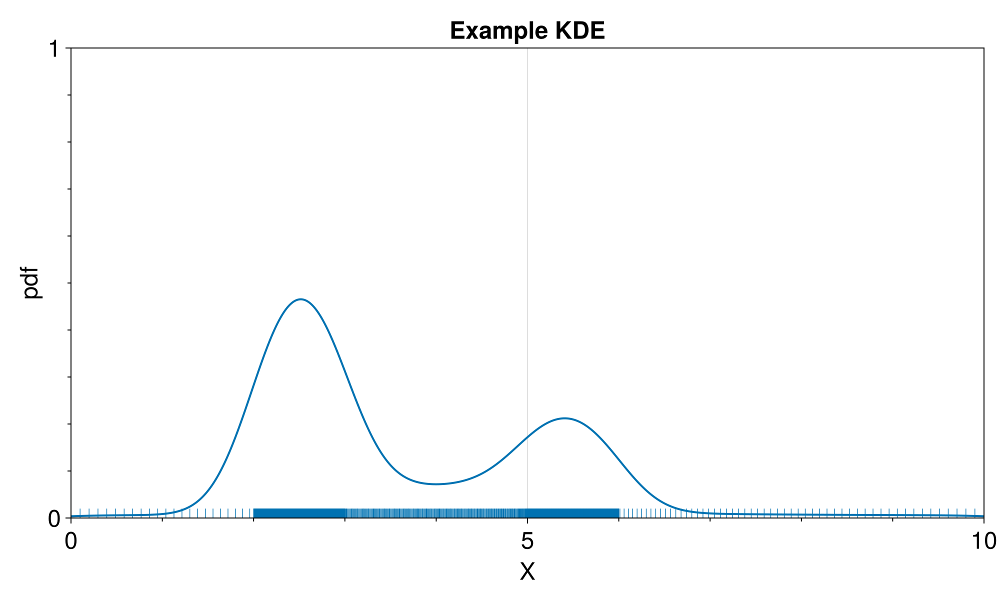

In [119]:
fig = Figure(size=(1000, 600), fontsize=24)
ax = Axis(fig[1,1]; 
    #xscale=log10, 
    #yscale=log10, 
    xticks=[0,5,10], 
    yticks=[0,1],
    limits=((0, 10), (0, 1)),
    title = @sprintf("Example KDE"),
    xlabel = "X",
    ylabel = "pdf",
    xminorticks = IntervalsBetween(5),
    xminorticksvisible=true,
    yminorticks = IntervalsBetween(10),
    yminorticksvisible=true)

data = vcat(0, (0.001 * (1:1000) .+ 2), (0.0025 * (1:400) .+ 5), (0.01 * (0:199) .+ 3), (5 .+ 0.0005 * (-100:100) .* abs.(-100:100)), 10)
dop = zeros(size(data))
ω_i, ω_pdf, ω_abs_pdf = estimate_pdfV2(data, dop)
abs_E = abs.(ω_i .* ω_abs_pdf)
rel_E = ω_i .* ω_pdf
#abs_mask = abs_E .>= (1e-10 * maximum(abs_E))
#rel_mask = rel_E .>= (1e-10 * maximum(rel_E))

#lines!(ax, ω_i, abs_E, color=:black, label=rich("E = ω*f(ω", subscript("abs"), ")"))
#lines!(ax, ω_i, est_E, linestyle=:dash, color=:black, label="Matern estimate")
scatter!(ax, data, 0.01*ones(size(data)), marker='|', markersize=10)
lines!(ax, ω_i, ω_pdf, linewidth=2)

fig

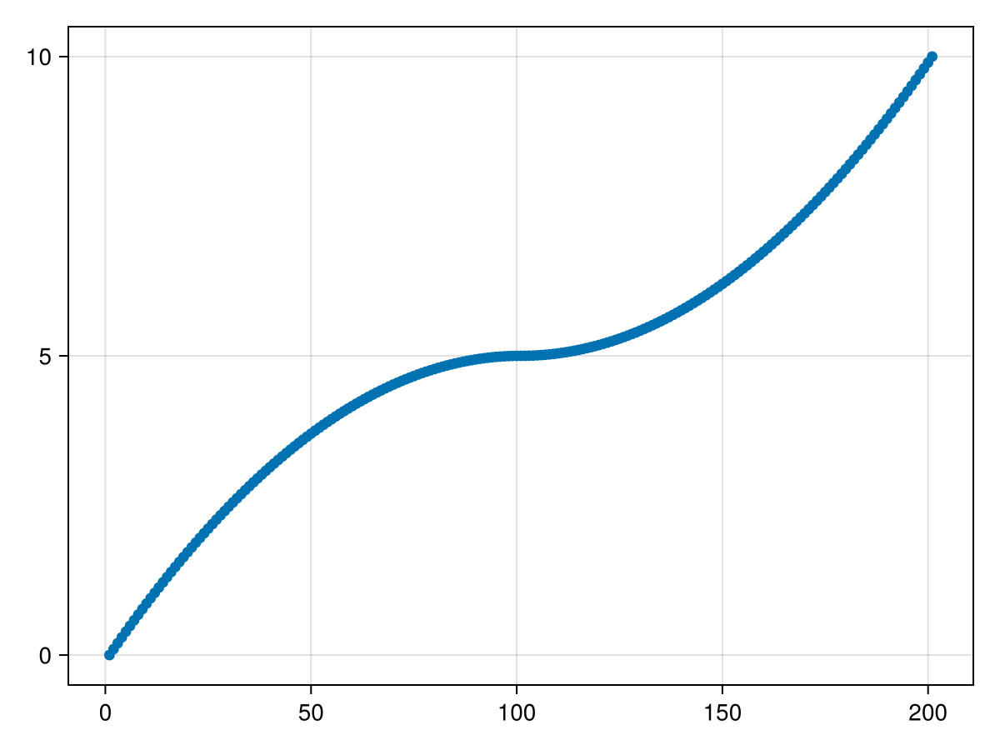

In [118]:
scatter(5 .+ 0.0005 * (-100:100) .* abs.(-100:100))

In [155]:
include("load_file.jl")
filename_func(idx) = @sprintf("/scratch/nad9961/swqg/53531742/14/packets.%06d.jld2", idx)
t1, x1, k1, u1 = load_packet_analysis_files_collated(filename_func, 0:2; packet_idxs=1:10, load_velocity=true)
f0, sqrtgH = read_parameters("/scratch/nad9961/swqg/53531742/14")
ω_rel = @. sqrt(f0^2 + sqrtgH^2 * (k1[:,:,1]^2 + k1[:,:,2]^2))
doppler_shift = u1[:,:,1] .* k1[:,:,1] + u1[:,:,2] .* k1[:,:,2]
Ω = ω_rel + doppler_shift;

10, 2579
Reading file: /scratch/nad9961/swqg/53531742/14/packets.000000.jld2
Reading file: /scratch/nad9961/swqg/53531742/14/packets.000001.jld2
Reading file: /scratch/nad9961/swqg/53531742/14/packets.000002.jld2


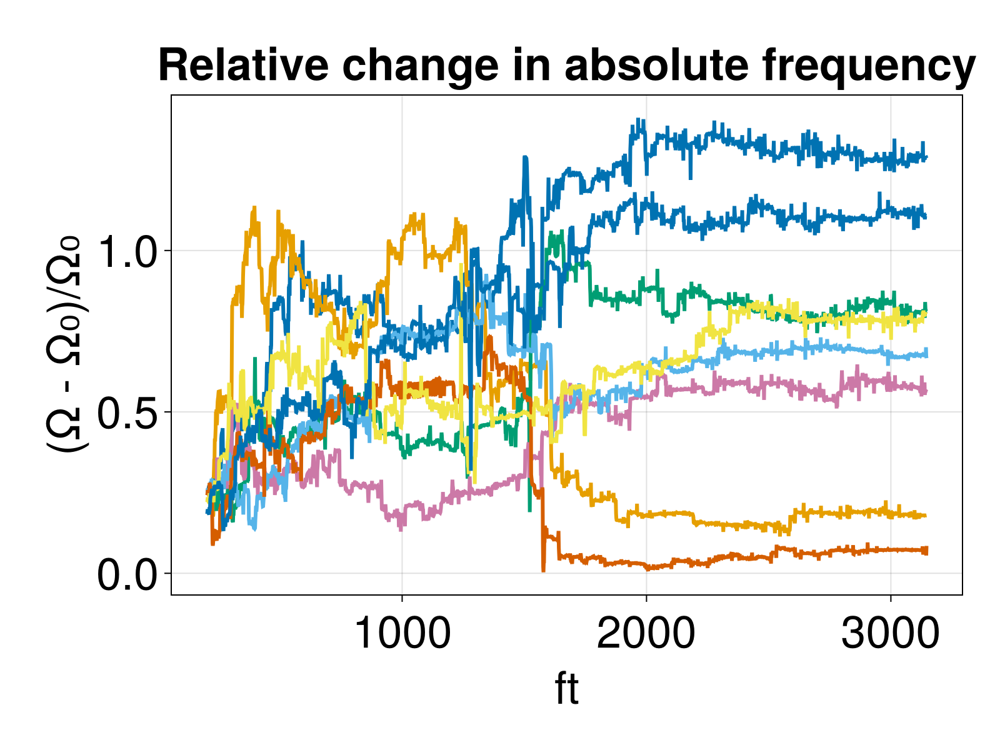

In [181]:
fig2 = Figure(size=(800, 600), fontsize = 36, figure_padding = 30)
ax2 = Axis(fig2[1, 1]; 
        title = "Relative change in absolute frequency", xlabel="ft", ylabel="(Ω - Ω₀)/Ω₀"
)
t_fix = .~(t1 .== 0)
for i=1:8
    initial_omega = Ω[1,i]
    lines!(ax2, t1[t_fix], (Ω[t_fix, i] .- initial_omega) / initial_omega, linewidth=3)
end

fig2

In [79]:
vcat(0, [1, 2, 3, 4], 2)

6-element Vector{Int64}:
 0
 1
 2
 3
 4
 2